## Machine Learning Project -
### Predicting Loan Defaults

In this project, we will analyze a dataset containing data on potential borrowers. The goal of this project is to build a model predicting the loan default of potential borrowers. 

In [1]:
# importing libraries necessary for this project  
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px 
import plotly.figure_factory as ff
import seaborn as sns
from sklearn.metrics import f1_score
from sklearn.impute import SimpleImputer
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.dummy import DummyClassifier
from sklearn.metrics import classification_report,confusion_matrix,precision_score,roc_curve,recall_score,roc_auc_score,auc,accuracy_score,precision_recall_curve
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import cross_val_score 
from sklearn.tree import export_graphviz
import graphviz 
from sklearn import tree

In [2]:
data=pd.read_csv(r'C:/Users/princ/Downloads/Dataset-20230202/Dataset (1).csv')

In [3]:
data.head()

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   credit.policy      9578 non-null   int64  
 1   purpose            9578 non-null   object 
 2   int.rate           9578 non-null   float64
 3   installment        9578 non-null   float64
 4   log.annual.inc     9578 non-null   float64
 5   dti                9578 non-null   float64
 6   fico               9578 non-null   int64  
 7   days.with.cr.line  9578 non-null   float64
 8   revol.bal          9578 non-null   int64  
 9   revol.util         9578 non-null   float64
 10  inq.last.6mths     9578 non-null   int64  
 11  delinq.2yrs        9578 non-null   int64  
 12  pub.rec            9578 non-null   int64  
 13  not.fully.paid     9578 non-null   int64  
dtypes: float64(6), int64(7), object(1)
memory usage: 1.0+ MB


Here we have 14 variables , out of which 1 is object and others are numercial .
not.fully.paid is the target variable which tells us whether the borrower will default the loan or not 

In [5]:
data.describe()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
count,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9.578000e+03,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000
mean,0.804970,0.122640,319.089413,10.932117,12.606679,710.846314,4560.767197,1.691396e+04,46.799236,1.577469,0.163708,0.062122,0.160054
std,0.396245,0.026847,207.071301,0.614813,6.883970,37.970537,2496.930377,3.375619e+04,29.014417,2.200245,0.546215,0.262126,0.366676
min,0.000000,0.060000,15.670000,7.547502,0.000000,612.000000,178.958333,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.103900,163.770000,10.558414,7.212500,682.000000,2820.000000,3.187000e+03,22.600000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.122100,268.950000,10.928884,12.665000,707.000000,4139.958333,8.596000e+03,46.300000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,0.140700,432.762500,11.291293,17.950000,737.000000,5730.000000,1.824950e+04,70.900000,2.000000,0.000000,0.000000,0.000000
max,1.000000,0.216400,940.140000,14.528354,29.960000,827.000000,17639.958330,1.207359e+06,119.000000,33.000000,13.000000,5.000000,1.000000


Here , we observe that there are no missing values in the dataset provided .

## Exploratory Data Analysis

 #### - Univariate Analysis
  (For numerical variables)

credit.policy ,  int.rate , installment , log.annual.inc , dti , fico , days.with.cr.line , revol.bal  , revol.util , inq.last.6mths ,  delinq.2yrs , pub.rec  , not.fully.paid 

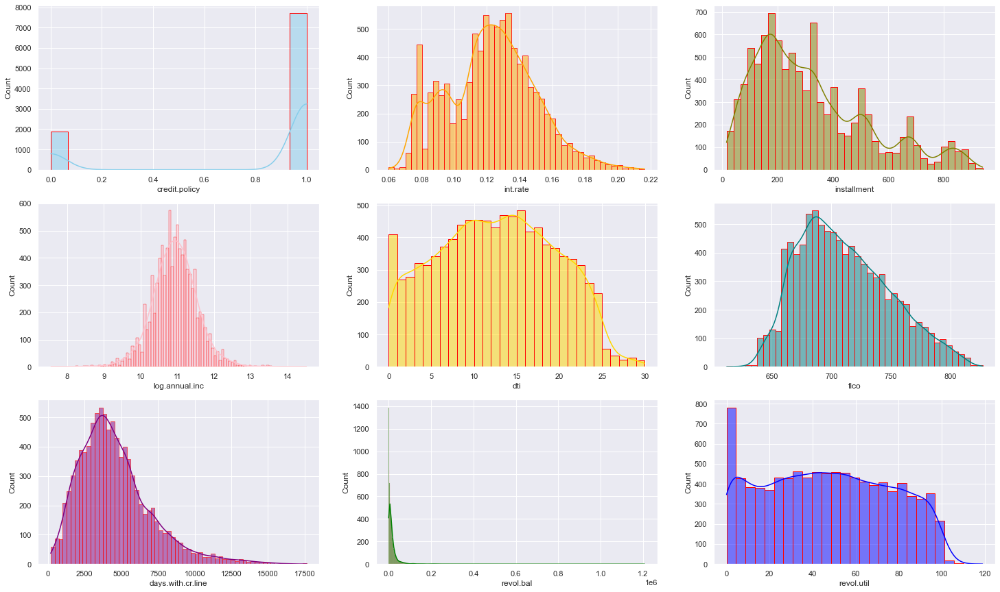

In [6]:
sns.set(style="darkgrid")
fig, axs = plt.subplots(3,3, figsize=(25, 15))

sns.histplot(data, x="credit.policy", ec="red",kde=True, color="skyblue",ax=axs[0, 0])
sns.histplot(data, x="int.rate", ec="red", kde=True, color="orange",ax=axs[0, 1])
sns.histplot(data, x="installment", ec="red", kde=True, color="olive",ax=axs[0, 2])
sns.histplot(data, x="log.annual.inc", ec="red", kde=True, color="pink",ax=axs[1, 0])
sns.histplot(data, x="dti", ec="red", kde=True, color="gold",ax=axs[1, 1])
sns.histplot(data, x="fico", ec="red", kde=True, color="teal",ax=axs[1,2])
sns.histplot(data, x="days.with.cr.line", ec="red", kde=True, color="purple",ax=axs[2, 0])
sns.histplot(data, x="revol.bal", ec="red", kde=True, color="green",ax=axs[2, 1])
sns.histplot(data, x="revol.util", ec="red", kde=True, color="blue",ax=axs[2, 2])


plt.show()

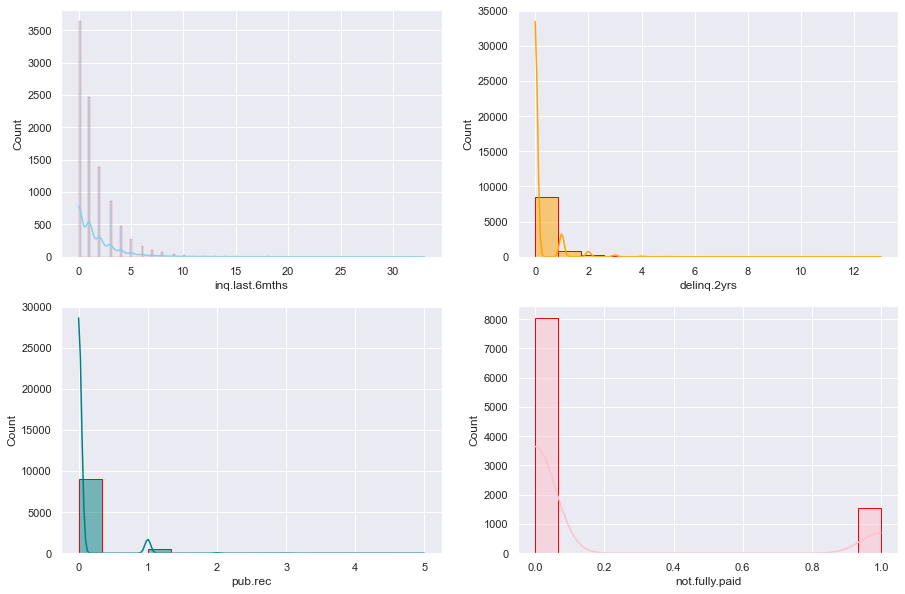

In [7]:
sns.set(style="darkgrid")
fig, axs = plt.subplots(2,2, figsize=(15, 10))

sns.histplot(data, x="inq.last.6mths", ec="red", kde=True, color="skyblue",ax=axs[0, 0])
sns.histplot(data, x="delinq.2yrs", ec="red", kde=True, color="orange",ax=axs[0, 1])
sns.histplot(data, x="pub.rec", ec="red", kde=True, color="teal",ax=axs[1, 0])
sns.histplot(data, x="not.fully.paid", ec="red", kde=True, color="pink",ax=axs[1, 1])
plt.show()

C:\Users\princ\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\princ\anaconda3\lib\site-packages\seaborn\distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
C:\Users\princ\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\princ\anaconda3\lib\site-packages\seaborn\distr

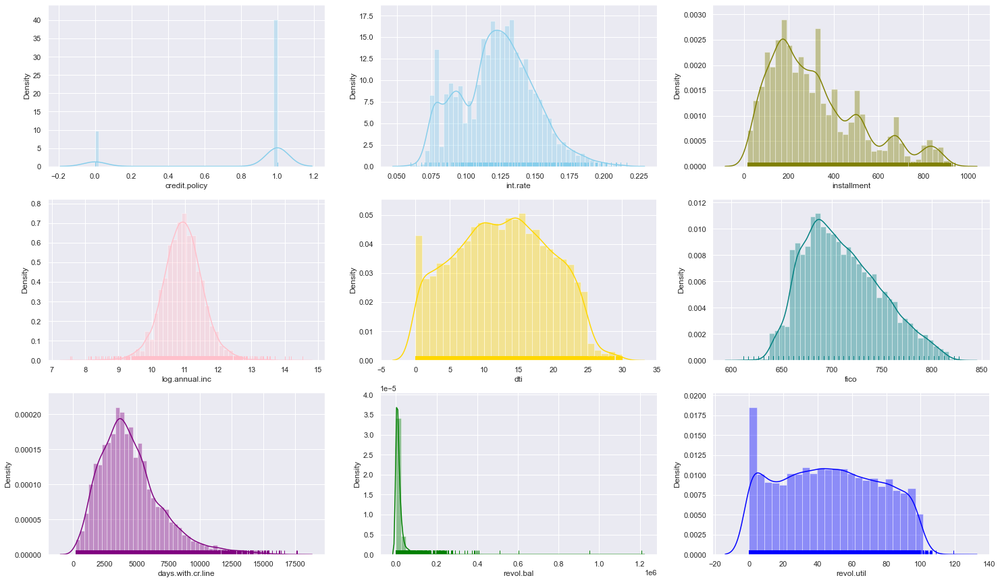

In [8]:
sns.set(style="darkgrid")
fig, axs = plt.subplots(3,3, figsize=(25, 15))
sns.distplot(data["credit.policy"],rug=True,color="skyblue",ax=axs[0, 0]);
sns.distplot(data["int.rate"],rug=True,color="skyblue",ax=axs[0, 1]);
sns.distplot(data["installment"], rug=True, kde=True, color="olive",ax=axs[0, 2])
sns.distplot(data["log.annual.inc"], rug=True, kde=True, color="pink",ax=axs[1, 0])
sns.distplot(data["dti"], rug=True, kde=True, color="gold",ax=axs[1, 1])
sns.distplot(data["fico"], rug=True, kde=True, color="teal",ax=axs[1,2])
sns.distplot(data["days.with.cr.line"], rug=True, kde=True, color="purple",ax=axs[2, 0])
sns.distplot(data["revol.bal"], rug=True, kde=True, color="green",ax=axs[2, 1])
sns.distplot(data["revol.util"], rug=True, kde=True, color="blue",ax=axs[2, 2])

plt.show()

C:\Users\princ\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\princ\anaconda3\lib\site-packages\seaborn\distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
C:\Users\princ\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\princ\anaconda3\lib\site-packages\seaborn\distr

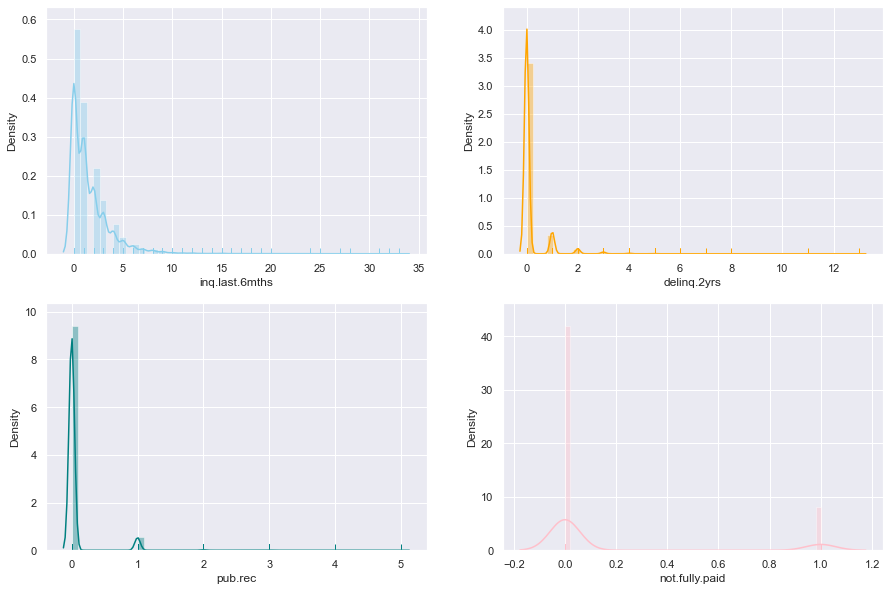

In [9]:
sns.set(style="darkgrid")
fig, axs = plt.subplots(2,2, figsize=(15, 10))

sns.distplot(data["inq.last.6mths"], rug=True, kde=True, color="skyblue",ax=axs[0, 0])
sns.distplot(data["delinq.2yrs"], rug=True, kde=True, color="orange",ax=axs[0, 1])
sns.distplot(data["pub.rec"], rug=True, kde=True, color="teal",ax=axs[1, 0])
sns.distplot(data["not.fully.paid"], rug=True, kde=True, color="pink",ax=axs[1, 1])
plt.show()

#### - Univariate Analysis
( for categorical variables)

purpose

In [10]:
print(data["purpose"].value_counts())

debt_consolidation    3957
all_other             2331
credit_card           1262
home_improvement       629
small_business         619
major_purchase         437
educational            343
Name: purpose, dtype: int64


C:\Users\princ\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'debt_consolidation'),
  Text(1, 0, 'all_other'),
  Text(2, 0, 'credit_card'),
  Text(3, 0, 'home_improvement'),
  Text(4, 0, 'small_business'),
  Text(5, 0, 'major_purchase'),
  Text(6, 0, 'educational')])

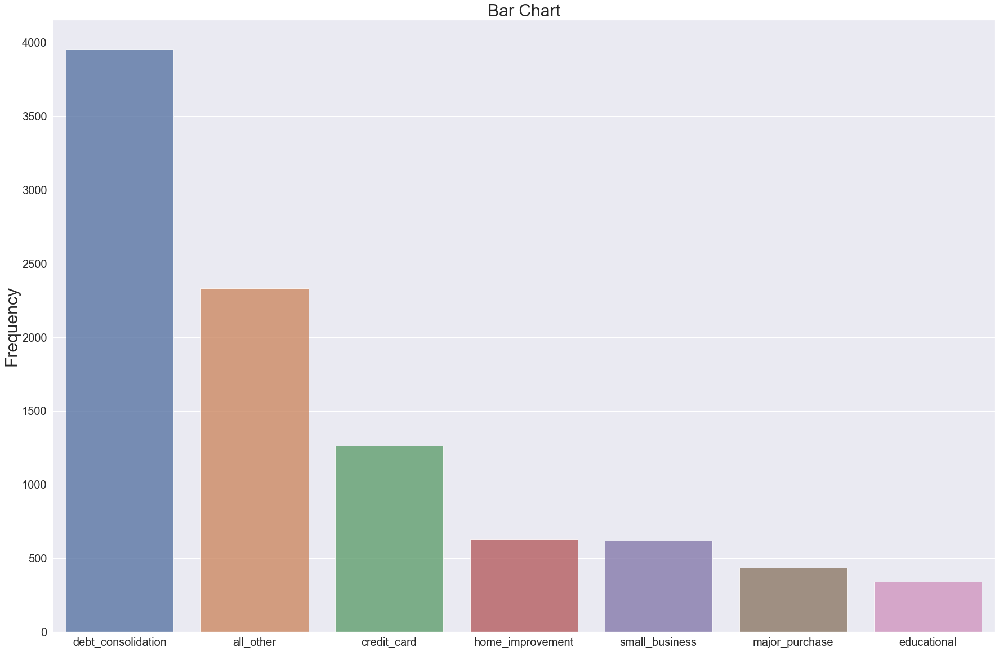

In [11]:
x = data['purpose'].value_counts()
y = x.sort_index()
plt.figure(figsize=(30,20))
sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Bar Chart", fontsize=30)
plt.ylabel('Frequency', fontsize=30)
plt.yticks(fontsize=20)
plt.xlabel('', fontsize=20)
plt.xticks(fontsize=20)

<AxesSubplot:title={'center':'Pie Chart'}, ylabel='purpose'>

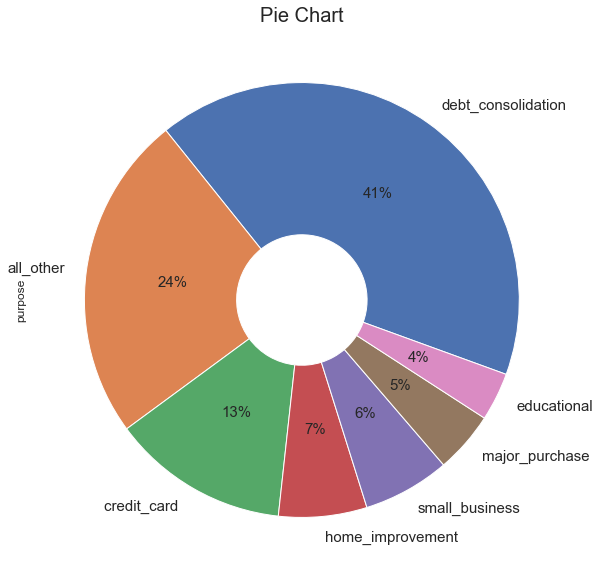

In [12]:
plt.figure(figsize=(20,10))
plt.title('Pie Chart', fontsize=20)
data['purpose'].value_counts().plot(kind='pie', labels=['debt_consolidation','all_other','credit_card ','home_improvement','small_business','major_purchase','educational'],
                              wedgeprops=dict(width=.7), autopct='%1.0f%%', startangle= -20, 
                              textprops={'fontsize': 15})

#### - Bivariate Analysis

####                                                                                      Scatter Plots 

In [13]:
fig = px.scatter_matrix(data,dimensions=['credit.policy','int.rate','installment'],color="not.fully.paid")
fig.show()

In [14]:
fig = px.scatter_matrix(data,dimensions=['log.annual.inc','dti','fico'],color="not.fully.paid")
fig.show()

In [15]:
fig = px.scatter_matrix(data,dimensions=['days.with.cr.line','revol.bal','revol.util'],color="not.fully.paid")
fig.show()

In [16]:
fig = px.scatter_matrix(data,dimensions=['inq.last.6mths','delinq.2yrs','pub.rec'],color="not.fully.paid")
fig.show()

In [17]:
fig = px.scatter_matrix(data,dimensions=['purpose'],color="not.fully.paid")
fig.show()

<AxesSubplot:>

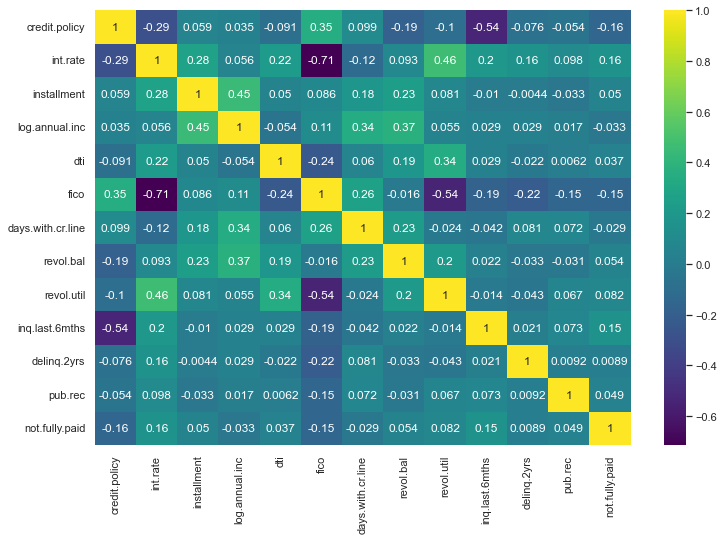

In [18]:
plt.figure(figsize=(12, 8))
sns.heatmap(data.corr(), annot=True, cmap='viridis')

#### Here , we see that all the variables have a linear relationship with the target variable 'not.fully.paid'

#### Side by Side Box Plots 

In [19]:
fig = px.box(data, x='not.fully.paid', y='credit.policy', points="all")
fig.show()

In [20]:
fig = px.box(data, x='not.fully.paid', y='int.rate',points="all")
fig.show()

In [21]:
fig = px.box(data, x='not.fully.paid', y='installment', points="all")
fig.show()

In [22]:
fig = px.box(data, x='not.fully.paid', y='log.annual.inc', points="all")
fig.show()

In [23]:
fig = px.box(data, x='not.fully.paid', y='dti', points="all")
fig.show()

In [24]:
fig = px.box(data, x='not.fully.paid', y='fico', points="all")
fig.show()

In [25]:
fig = px.box(data, x='not.fully.paid', y='days.with.cr.line', points="all")
fig.show()

In [26]:
fig = px.box(data, x='not.fully.paid', y='revol.bal', points="all")
fig.show()

In [27]:
fig = px.box(data, x='not.fully.paid', y='revol.util', points="all")
fig.show()

In [28]:
fig = px.box(data, x='not.fully.paid', y='inq.last.6mths', points="all")
fig.show()

In [29]:
fig = px.box(data, x='not.fully.paid', y='delinq.2yrs', points="all")
fig.show()

In [30]:
fig = px.box(data, x='not.fully.paid', y='pub.rec', points="all")
fig.show()

#### Observing the above box plots , we confirm that the variables:
##### int.rate,installment,log.annual.inc,fico,days.with.cr.line,recol.bal,inq.last.6mths,delinq.2yrs,pub.rec 
#### has outlier values which needs to be treated for correct prediction.

### Missing Values

In [31]:
data.isna().mean()*100

credit.policy        0.0
purpose              0.0
int.rate             0.0
installment          0.0
log.annual.inc       0.0
dti                  0.0
fico                 0.0
days.with.cr.line    0.0
revol.bal            0.0
revol.util           0.0
inq.last.6mths       0.0
delinq.2yrs          0.0
pub.rec              0.0
not.fully.paid       0.0
dtype: float64

Here we observe that there are no missing values in the data 

### Outliers

- Using Inter Quartile Range

In [32]:
data.describe()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
count,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9.578000e+03,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000
mean,0.804970,0.122640,319.089413,10.932117,12.606679,710.846314,4560.767197,1.691396e+04,46.799236,1.577469,0.163708,0.062122,0.160054
std,0.396245,0.026847,207.071301,0.614813,6.883970,37.970537,2496.930377,3.375619e+04,29.014417,2.200245,0.546215,0.262126,0.366676
min,0.000000,0.060000,15.670000,7.547502,0.000000,612.000000,178.958333,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.103900,163.770000,10.558414,7.212500,682.000000,2820.000000,3.187000e+03,22.600000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.122100,268.950000,10.928884,12.665000,707.000000,4139.958333,8.596000e+03,46.300000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,0.140700,432.762500,11.291293,17.950000,737.000000,5730.000000,1.824950e+04,70.900000,2.000000,0.000000,0.000000,0.000000
max,1.000000,0.216400,940.140000,14.528354,29.960000,827.000000,17639.958330,1.207359e+06,119.000000,33.000000,13.000000,5.000000,1.000000


In [33]:
def detect_outliers(df):
    data=np.sort(df)
    outliers=[]
    q1=df.quantile(0.25)
    q3=df.quantile(0.75)
    IQR=q3-q1
    lower_limit=q1-1.5*IQR
    upper_limit=q3+1.5*IQR
    for x in data:
        if ((x> upper_limit) or (x<lower_limit)):
            outliers.append(x)
    print(' outlier in the dataset is', outliers)
    print("Number of Outliers :",len(outliers))
    print("Lower Limit:",lower_limit)
    print("Upper Limit:",upper_limit)

In [34]:
detect_outliers(data['int.rate'])

 outlier in the dataset is [0.1979, 0.1979, 0.1979, 0.1979, 0.1979, 0.1979, 0.1982, 0.1982, 0.1982, 0.1982, 0.1982, 0.1982, 0.1982, 0.1982, 0.2011, 0.2011, 0.2011, 0.2011, 0.2011, 0.2011, 0.2011, 0.2011, 0.2011, 0.2016, 0.2017, 0.2017, 0.2017, 0.2017, 0.2017, 0.2017, 0.2052, 0.2052, 0.2052, 0.2052, 0.2086, 0.2086, 0.2086, 0.2086, 0.2086, 0.2086, 0.209, 0.209, 0.2121, 0.2121, 0.2121, 0.2121, 0.2121, 0.2121, 0.2121, 0.2164, 0.2164]
Number of Outliers : 51
Lower Limit: 0.04870000000000003
Upper Limit: 0.19589999999999996


In [35]:
detect_outliers(data['installment'])

 outlier in the dataset is [836.51, 836.66, 836.66, 836.66, 836.66, 836.66, 836.66, 836.66, 836.66, 836.66, 836.66, 836.66, 836.66, 836.66, 836.66, 836.66, 836.68, 837.67, 839.16, 839.16, 839.16, 839.67, 839.67, 839.95, 840.15, 840.15, 840.15, 840.26, 840.45, 840.45, 840.45, 840.83, 840.83, 840.83, 840.83, 840.83, 840.83, 840.83, 840.83, 840.83, 840.83, 841.76, 842.47, 843.78, 843.8, 844.26, 844.28, 844.28, 844.28, 844.28, 844.59, 845.0, 845.02, 845.02, 845.25, 846.7, 847.53, 847.9, 848.42, 848.42, 848.42, 848.42, 848.99, 848.99, 849.02, 849.06, 849.22, 849.22, 849.38, 850.44, 851.41, 851.41, 851.89, 852.57, 852.57, 852.57, 852.87, 852.87, 853.43, 854.32, 855.3, 855.73, 855.73, 855.73, 855.73, 856.18, 856.63, 856.63, 857.46, 859.07, 859.57, 859.57, 859.57, 860.34, 860.91, 861.63, 861.63, 861.63, 861.88, 861.88, 861.88, 861.88, 861.88, 861.99, 862.97, 863.42, 863.42, 864.51, 865.78, 865.92, 866.13, 866.13, 866.13, 866.13, 866.13, 866.13, 866.13, 866.16, 866.16, 866.16, 866.16, 866.76, 8

In [36]:
detect_outliers(data['log.annual.inc'])

 outlier in the dataset is [7.547501683, 7.60090246, 8.101677747, 8.160518247, 8.188689124, 8.29404964, 8.29404964, 8.29404964, 8.342839804, 8.411832676, 8.476371197, 8.476371197, 8.494538501, 8.517193191, 8.517193191, 8.517193191, 8.612503371, 8.672999643, 8.699514748, 8.699514748, 8.699514748, 8.699514748, 8.699514748, 8.779557456, 8.853665428, 8.853665428, 8.862483576, 8.881836305, 8.881836305, 8.892886141, 8.9226583, 8.9226583, 8.9226583, 8.9751293, 8.987196821, 8.987196821, 8.987196821, 8.987196821, 8.987196821, 8.987196821, 8.998136761, 9.035986985, 9.047821442, 9.071078305, 9.169518377, 9.169518377, 9.169518377, 9.169518377, 9.169518377, 9.183174704, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.210340372, 9.229358378, 9.259130536, 9.271999752, 9.287301413, 9.287301413, 9.287301413, 9.298351249, 9.3056505

In [37]:
detect_outliers(data['fico'])

 outlier in the dataset is [822, 822, 822, 822, 822, 827]
Number of Outliers : 6
Lower Limit: 599.5
Upper Limit: 819.5


In [38]:
detect_outliers(data['days.with.cr.line'])

 outlier in the dataset is [10110.0, 10110.0, 10110.0, 10110.04167, 10140.0, 10169.95833, 10170.0, 10170.0, 10170.0, 10199.0, 10199.95833, 10199.95833, 10200.0, 10200.0, 10200.0, 10230.0, 10236.0, 10252.0, 10259.95833, 10259.95833, 10259.95833, 10260.0, 10260.04167, 10260.04167, 10289.95833, 10290.0, 10290.0, 10290.0, 10290.04167, 10290.04167, 10290.04167, 10292.0, 10308.95833, 10319.95833, 10320.0, 10320.0, 10320.0, 10320.04167, 10320.04167, 10350.0, 10350.04167, 10368.04167, 10379.95833, 10380.04167, 10380.04167, 10380.04167, 10409.95833, 10410.04167, 10411.04167, 10439.95833, 10439.95833, 10440.0, 10440.04167, 10443.04167, 10445.95833, 10469.95833, 10470.0, 10470.04167, 10470.04167, 10471.0, 10474.0, 10499.95833, 10500.0, 10529.95833, 10530.0, 10560.0, 10590.0, 10590.0, 10590.0, 10591.0, 10619.95833, 10620.0, 10620.0, 10620.0, 10649.95833, 10679.95833, 10680.0, 10681.04167, 10709.95833, 10710.0, 10710.0, 10739.95833, 10739.95833, 10740.0, 10742.95833, 10769.95833, 10770.04167, 10770

In [39]:
detect_outliers(data['revol.bal'])

 outlier in the dataset is [40868, 40868, 40882, 40904, 40915, 40918, 40934, 41040, 41042, 41059, 41063, 41077, 41154, 41170, 41190, 41248, 41347, 41478, 41491, 41568, 41603, 41674, 41705, 41893, 41921, 41959, 41977, 42053, 42106, 42125, 42157, 42160, 42307, 42411, 42430, 42465, 42470, 42518, 42530, 42613, 42619, 42632, 42670, 42703, 42752, 42813, 42863, 42876, 42969, 42987, 43039, 43075, 43110, 43141, 43232, 43302, 43312, 43373, 43488, 43567, 43615, 43620, 43703, 43712, 43724, 43751, 43799, 43863, 43868, 43878, 43878, 43922, 43998, 44040, 44084, 44098, 44128, 44135, 44198, 44229, 44248, 44282, 44293, 44313, 44331, 44489, 44539, 44543, 44548, 44643, 44790, 44808, 44827, 44834, 44880, 44887, 44889, 44991, 45028, 45050, 45076, 45210, 45251, 45303, 45304, 45340, 45383, 45410, 45414, 45428, 45442, 45444, 45496, 45623, 45953, 45988, 46017, 46031, 46055, 46086, 46100, 46180, 46226, 46268, 46306, 46336, 46338, 46373, 46392, 46427, 46429, 46525, 46563, 46663, 46670, 46789, 46817, 46881, 46882,

In [40]:
detect_outliers(data['inq.last.6mths'])

 outlier in the dataset is [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 

In [41]:
detect_outliers(data['delinq.2yrs'])

 outlier in the dataset is [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [42]:
detect_outliers(data['pub.rec'])

 outlier in the dataset is [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

#### Here , we observe that :
- int.rate has 51 outliers
- installment has 236 outliers
- log.annual.inc has 238 outliers
- fico has 6 outliers
- days.with.cr.line has 346 outliers
- revol.bal has 780 outliers
- inq.last.6mths has 478 outliers 
- delinq.2yrs has 1120 outliers
- pub.rec has 559 outliers

### Treating the Outliers 

#### For 'int.rate'

In [43]:
data.describe()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
count,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9.578000e+03,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000
mean,0.804970,0.122640,319.089413,10.932117,12.606679,710.846314,4560.767197,1.691396e+04,46.799236,1.577469,0.163708,0.062122,0.160054
std,0.396245,0.026847,207.071301,0.614813,6.883970,37.970537,2496.930377,3.375619e+04,29.014417,2.200245,0.546215,0.262126,0.366676
min,0.000000,0.060000,15.670000,7.547502,0.000000,612.000000,178.958333,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.103900,163.770000,10.558414,7.212500,682.000000,2820.000000,3.187000e+03,22.600000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.122100,268.950000,10.928884,12.665000,707.000000,4139.958333,8.596000e+03,46.300000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,0.140700,432.762500,11.291293,17.950000,737.000000,5730.000000,1.824950e+04,70.900000,2.000000,0.000000,0.000000,0.000000
max,1.000000,0.216400,940.140000,14.528354,29.960000,827.000000,17639.958330,1.207359e+06,119.000000,33.000000,13.000000,5.000000,1.000000


In [44]:
data["int.rate"] = np.where(data["int.rate"] <0.04870000000000003, 0.122640,data['int.rate'])
data["int.rate"] = np.where(data["int.rate"] >0.19589999999999996, 0.122640,data['int.rate'])

In [45]:
data['int.rate'].describe()

count    9578.000000
mean        0.122207
std         0.026176
min         0.060000
25%         0.103900
50%         0.122100
75%         0.139200
max         0.194700
Name: int.rate, dtype: float64

#### for 'installment'

In [46]:
data["installment"] = np.where(data["installment"] <-239.71874999999991,319.089413,data['installment'])
data["installment"] = np.where(data["installment"] >836.2512499999999, 319.089413,data['installment'])

In [47]:
data['installment'].describe()

count    9578.000000
mean      305.588916
std       187.844948
min        15.670000
25%       163.770000
50%       268.950000
75%       407.087500
max       836.230000
Name: installment, dtype: float64

#### For 'log.annual.inc'

In [48]:
data["log.annual.inc"] = np.where(data["log.annual.inc"] < 9.45909442375,0.932117,data['log.annual.inc'])
data["log.annual.inc"] = np.where(data["log.annual.inc"] >12.39061201375, 0.932117,data['log.annual.inc'])

In [49]:
data['log.annual.inc'].describe()

count    9578.000000
mean       10.682648
std         1.646049
min         0.932117
25%        10.538466
50%        10.915088
75%        11.289782
max        12.388394
Name: log.annual.inc, dtype: float64

#### For 'fico'

In [50]:
data["fico"] = np.where(data["fico"] < 599.5,710.846314,data['fico'])
data["fico"] = np.where(data["fico"] >819.5, 710.846314,data['fico'])

In [51]:
data['fico'].describe()

count    9578.000000
mean      710.776162
std        37.866840
min       612.000000
25%       682.000000
50%       707.000000
75%       737.000000
max       817.000000
Name: fico, dtype: float64

#### For 'days.with.cr.line '

In [52]:
data["days.with.cr.line"] = np.where(data["days.with.cr.line"] < -1545.0,4560.767197,data['days.with.cr.line'])
data["days.with.cr.line"] = np.where(data["days.with.cr.line"] >10095.0, 4560.767197,data['days.with.cr.line'])

In [53]:
data['days.with.cr.line'].describe()

count     9578.000000
mean      4290.513694
std       2012.891558
min        178.958333
25%       2820.000000
50%       4139.958333
75%       5460.000000
max      10080.000000
Name: days.with.cr.line, dtype: float64

#### For 'revol.bal'

In [54]:
data["revol.bal"] = np.where(data["revol.bal"] < -19406.75,1.691396e+04,data['revol.bal'])
data["revol.bal"] = np.where(data["revol.bal"] >40843.25, 1.691396e+04,data['revol.bal'])

In [55]:
data['revol.bal'].describe()

count     9578.000000
mean     10747.397870
std       9125.998294
min          0.000000
25%       3187.000000
50%       8596.000000
75%      16913.960000
max      40781.000000
Name: revol.bal, dtype: float64

#### For 'inq.last.6mths'

In [56]:
data["inq.last.6mths"] = np.where(data["inq.last.6mths"] < -3.0,1.577469,data['inq.last.6mths'])
data["inq.last.6mths"] = np.where(data["inq.last.6mths"] >5.0,1.577469,data['inq.last.6mths'])

In [57]:
data['inq.last.6mths'].describe()

count    9578.000000
mean        1.238884
std         1.324969
min         0.000000
25%         0.000000
50%         1.000000
75%         2.000000
max         5.000000
Name: inq.last.6mths, dtype: float64

#### For 'delinq.2yrs'

In [58]:
data["delinq.2yrs"] = np.where(data["delinq.2yrs"] < 1,0.163708,data['delinq.2yrs'])
data["delinq.2yrs"] = np.where(data["delinq.2yrs"] >13,0.163708,data['delinq.2yrs'])

In [59]:
data['delinq.2yrs'].describe()

count    9578.000000
mean        0.308273
std         0.503766
min         0.163708
25%         0.163708
50%         0.163708
75%         0.163708
max        13.000000
Name: delinq.2yrs, dtype: float64

#### For 'pub.rec'

In [60]:
data["pub.rec"] = np.where(data["pub.rec"] < 0,0.062122,data['pub.rec'])
data["pub.rec"] = np.where(data["pub.rec"] >5,0.062122,data['pub.rec'])

In [61]:
data['pub.rec'].describe()

count    9578.000000
mean        0.062122
std         0.262126
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         5.000000
Name: pub.rec, dtype: float64

In [62]:
data.describe()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
count,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000
mean,0.804970,0.122207,305.588916,10.682648,12.606679,710.776162,4290.513694,10747.397870,46.799236,1.238884,0.308273,0.062122,0.160054
std,0.396245,0.026176,187.844948,1.646049,6.883970,37.866840,2012.891558,9125.998294,29.014417,1.324969,0.503766,0.262126,0.366676
min,0.000000,0.060000,15.670000,0.932117,0.000000,612.000000,178.958333,0.000000,0.000000,0.000000,0.163708,0.000000,0.000000
25%,1.000000,0.103900,163.770000,10.538466,7.212500,682.000000,2820.000000,3187.000000,22.600000,0.000000,0.163708,0.000000,0.000000
50%,1.000000,0.122100,268.950000,10.915088,12.665000,707.000000,4139.958333,8596.000000,46.300000,1.000000,0.163708,0.000000,0.000000
75%,1.000000,0.139200,407.087500,11.289782,17.950000,737.000000,5460.000000,16913.960000,70.900000,2.000000,0.163708,0.000000,0.000000
max,1.000000,0.194700,836.230000,12.388394,29.960000,817.000000,10080.000000,40781.000000,119.000000,5.000000,13.000000,5.000000,1.000000


### Feature Engineering

In [63]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   credit.policy      9578 non-null   int64  
 1   purpose            9578 non-null   object 
 2   int.rate           9578 non-null   float64
 3   installment        9578 non-null   float64
 4   log.annual.inc     9578 non-null   float64
 5   dti                9578 non-null   float64
 6   fico               9578 non-null   float64
 7   days.with.cr.line  9578 non-null   float64
 8   revol.bal          9578 non-null   float64
 9   revol.util         9578 non-null   float64
 10  inq.last.6mths     9578 non-null   float64
 11  delinq.2yrs        9578 non-null   float64
 12  pub.rec            9578 non-null   float64
 13  not.fully.paid     9578 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 1.0+ MB


#### Here we have one categorical variable, 'purpose' that needs to be transformed  

In [64]:
data['purpose'].unique()

array(['debt_consolidation', 'credit_card', 'all_other',
       'home_improvement', 'small_business', 'major_purchase',
       'educational'], dtype=object)

In [65]:
categorical_columns=["purpose"]

In [66]:
dummy_df = pd.get_dummies(data[categorical_columns])
data=pd.concat([data,dummy_df],axis=1)
data = data.drop(categorical_columns, axis=1)

#### Dummy variables created for the categorical variable 'purpose'

In [67]:
data.head()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,purpose_all_other,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business
0,1,0.1189,829.10,11.350407,19.48,737.0,5639.958333,28854.0,52.1,0.0,0.163708,0.0,0,0,0,1,0,0,0,0
1,1,0.1071,228.22,11.082143,14.29,707.0,2760.000000,33623.0,76.7,0.0,0.163708,0.0,0,0,1,0,0,0,0,0
2,1,0.1357,366.86,10.373491,11.63,682.0,4710.000000,3511.0,25.6,1.0,0.163708,0.0,0,0,0,1,0,0,0,0
3,1,0.1008,162.34,11.350407,8.10,712.0,2699.958333,33667.0,73.2,1.0,0.163708,0.0,0,0,0,1,0,0,0,0
4,1,0.1426,102.92,11.299732,14.97,667.0,4066.000000,4740.0,39.5,0.0,1.000000,0.0,0,0,1,0,0,0,0,0


#### We have a column 'years.cr.line' which has the information for the number of days the borrower has had a credit line.
#### We can convert this column to no of years for better understanding .

In [68]:
data['years.cr.line']=data['days.with.cr.line'].apply(lambda x: x/365)
data=data.drop(['days.with.cr.line'],axis=1)

In [69]:
data.head()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,purpose_all_other,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business,years.cr.line
0,1,0.1189,829.10,11.350407,19.48,737.0,28854.0,52.1,0.0,0.163708,0.0,0,0,0,1,0,0,0,0,15.451941
1,1,0.1071,228.22,11.082143,14.29,707.0,33623.0,76.7,0.0,0.163708,0.0,0,0,1,0,0,0,0,0,7.561644
2,1,0.1357,366.86,10.373491,11.63,682.0,3511.0,25.6,1.0,0.163708,0.0,0,0,0,1,0,0,0,0,12.904110
3,1,0.1008,162.34,11.350407,8.10,712.0,33667.0,73.2,1.0,0.163708,0.0,0,0,0,1,0,0,0,0,7.397146
4,1,0.1426,102.92,11.299732,14.97,667.0,4740.0,39.5,0.0,1.000000,0.0,0,0,1,0,0,0,0,0,11.139726


In [70]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   credit.policy               9578 non-null   int64  
 1   int.rate                    9578 non-null   float64
 2   installment                 9578 non-null   float64
 3   log.annual.inc              9578 non-null   float64
 4   dti                         9578 non-null   float64
 5   fico                        9578 non-null   float64
 6   revol.bal                   9578 non-null   float64
 7   revol.util                  9578 non-null   float64
 8   inq.last.6mths              9578 non-null   float64
 9   delinq.2yrs                 9578 non-null   float64
 10  pub.rec                     9578 non-null   float64
 11  not.fully.paid              9578 non-null   int64  
 12  purpose_all_other           9578 non-null   uint8  
 13  purpose_credit_card         9578 

### Splitting the Dataset intoTrain and Test

In [71]:
x=data.drop('not.fully.paid',axis=1)
y=data['not.fully.paid']

In [72]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.33,random_state=101,stratify=y)

 Let’s quickly do a check of the sizes of each array to confirm everything is in order.

In [73]:
print('Training Features Shape:', x_train.shape)
print('Training Labels Shape:', y_train.shape)
print('Testing Features Shape:', x_test.shape)
print('Testing Labels Shape:', y_test.shape)

Training Features Shape: (6417, 19)
Training Labels Shape: (6417,)
Testing Features Shape: (3161, 19)
Testing Labels Shape: (3161,)


### Model Building 

#### Building a Decision Tree model with default parameters 

In [74]:
dt = DecisionTreeClassifier()
dt.fit(x_train, y_train)
y_pred = dt.predict(x_test)

We will use AUC (Area Under Curve) as the evaluation metric. Our target value is binary so it’s a binary classification problem. AUC is a good way for evaluation for this type of problems.

In [75]:
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.5447983891977995

#### Checking model for overfitting

In [76]:
train_yhat = dt.predict(x_train)
train_acc = accuracy_score(y_train, train_yhat)
train_acc

1.0

In [77]:
test_yhat = dt.predict(x_test)
test_acc = accuracy_score(y_test, test_yhat)
test_acc

0.7472318886428345

From the above results , we conclude that the model is overfitting . So , in this case , we need to perform hyperparameter tuning to avoid this .

- For max-depth:

>1, train: 0.840, test: 0.840
>2, train: 0.841, test: 0.839
>3, train: 0.841, test: 0.839
>4, train: 0.842, test: 0.836
>5, train: 0.846, test: 0.835
>6, train: 0.849, test: 0.835
>7, train: 0.853, test: 0.823
>8, train: 0.863, test: 0.822
>9, train: 0.872, test: 0.817
>10, train: 0.883, test: 0.814
>11, train: 0.894, test: 0.804
>12, train: 0.906, test: 0.800
>13, train: 0.919, test: 0.793
>14, train: 0.929, test: 0.783
>15, train: 0.941, test: 0.780
>16, train: 0.948, test: 0.775
>17, train: 0.957, test: 0.771
>18, train: 0.964, test: 0.767
>19, train: 0.970, test: 0.761
>20, train: 0.976, test: 0.765


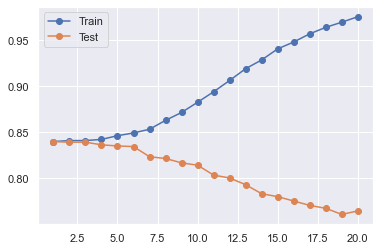

In [78]:
# define lists to collect scores
train_scores, test_scores = list(), list()
# define the tree depths to evaluate
values = [i for i in range(1, 21)]
# evaluate a decision tree for each depth
for i in values:
 # configure the model
 dt = DecisionTreeClassifier(max_depth=i)
 # fit model on the training dataset
 dt.fit(x_train, y_train)
 # evaluate on the train dataset
 train_yhat = dt.predict(x_train)
 train_acc = accuracy_score(y_train, train_yhat)
 train_scores.append(train_acc)
 # evaluate on the test dataset
 test_yhat = dt.predict(x_test)
 test_acc = accuracy_score(y_test, test_yhat)
 test_scores.append(test_acc)
 # summarize progress
 print('>%d, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
# plot of train and test scores vs tree depth
plt.plot(values, train_scores, '-o', label='Train')
plt.plot(values, test_scores, '-o', label='Test')
plt.legend()
plt.show()

We see the best value for max-depth is 1

- For min_samples_split:

>0, train: 0.976, test: 0.765
>0, train: 0.976, test: 0.765
>0, train: 0.976, test: 0.765
>0, train: 0.976, test: 0.765
>0, train: 0.976, test: 0.765
>0, train: 0.976, test: 0.765
>0, train: 0.976, test: 0.765
>0, train: 0.976, test: 0.765
>0, train: 0.976, test: 0.765
>1, train: 0.976, test: 0.765


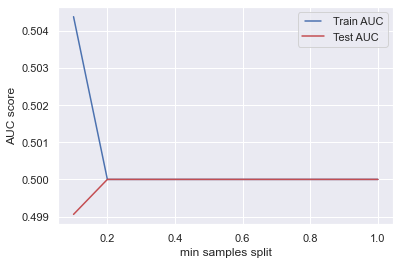

In [79]:
min_samples_splits = np.linspace(0.1, 1.0, 10, endpoint=True)
train_results = []
test_results = []
for min_samples_split in min_samples_splits:
   dt = DecisionTreeClassifier(min_samples_split=min_samples_split)
   dt.fit(x_train, y_train)
   train_pred = dt.predict(x_train)
   false_positive_rate, true_positive_rate, thresholds =    roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = dt.predict(x_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
   print('>%d, train: %.3f, test: %.3f' % (min_samples_split, train_acc, test_acc))

from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(min_samples_splits, train_results, 'b', label="Train AUC")
line2, = plt.plot(min_samples_splits, test_results, 'r', label="Test AUC")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('min samples split')
plt.show()

We see the best value for min_sample_split is 20%

- For min_samples_leaf:

(array([0.1, 0.2, 0.3, 0.4, 0.5]), 0.9755337385070906, 0.7646314457450174)
(array([0.1, 0.2, 0.3, 0.4, 0.5]), 0.9755337385070906, 0.7646314457450174)
(array([0.1, 0.2, 0.3, 0.4, 0.5]), 0.9755337385070906, 0.7646314457450174)
(array([0.1, 0.2, 0.3, 0.4, 0.5]), 0.9755337385070906, 0.7646314457450174)
(array([0.1, 0.2, 0.3, 0.4, 0.5]), 0.9755337385070906, 0.7646314457450174)


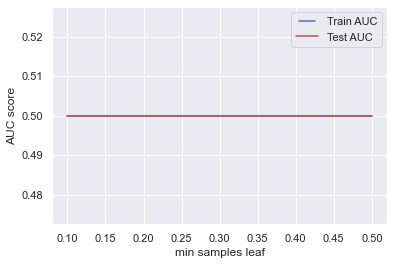

In [80]:
min_samples_leafs = np.linspace(0.1, 0.5, 5, endpoint=True)
train_results = []
test_results = []
for min_samples_leaf in min_samples_leafs:
   dt = DecisionTreeClassifier(min_samples_leaf=min_samples_leaf)
   dt.fit(x_train, y_train)
   train_pred = dt.predict(x_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = dt.predict(x_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
   print((min_samples_leafs, train_acc, test_acc))

from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(min_samples_leafs, train_results, 'b', label="Train AUC")
line2, = plt.plot(min_samples_leafs, test_results, 'r', label="Test AUC")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('min samples leaf')
plt.show()

For this , we can choose any value 

- For max_features:

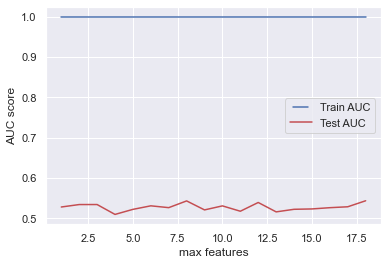

In [81]:
max_features = list(range(1,x_train.shape[1]))
train_results = []
test_results = []
for max_feature in max_features:
   dt = DecisionTreeClassifier(max_features=max_feature)
   dt.fit(x_train, y_train)
   train_pred = dt.predict(x_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = dt.predict(x_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(max_features, train_results, 'b', label="Train AUC")
line2, = plt.plot(max_features, test_results, 'r', label="Test AUC")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('max features')
plt.show()

This is also an overfitting case.

Based upon the observation above , adjusting the parameter values 

In [82]:
dt = DecisionTreeClassifier(criterion='gini',
    splitter='best',
    max_depth=1,
    min_samples_split=2,
    min_samples_leaf=2,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=None,
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    class_weight=None,
    ccp_alpha=0,)
dt.fit(x_train, y_train)
y_pred = dt.predict(x_test)

In [83]:
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.5

In [84]:
train_yhat = dt.predict(x_train)
train_acc = accuracy_score(y_train, train_yhat)
train_acc

0.83995636590307

In [85]:
test_yhat = dt.predict(x_test)
test_acc = accuracy_score(y_test, test_yhat)
test_acc

0.8399240746599177

We observe that there is no change in the performance of the model

In [86]:
predictions=dt.predict(x_test)
print(classification_report(y_test,predictions))
print('\n')
print(confusion_matrix(y_test,predictions))

              precision    recall  f1-score   support

           0       0.84      1.00      0.91      2655
           1       0.00      0.00      0.00       506

    accuracy                           0.84      3161
   macro avg       0.42      0.50      0.46      3161
weighted avg       0.71      0.84      0.77      3161



[[2655    0]
 [ 506    0]]


C:\Users\princ\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\princ\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\princ\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



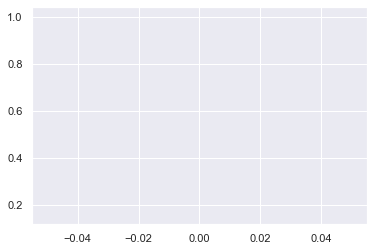

In [87]:
precision , recall , threshold=precision_recall_curve(y_test,predictions)
plt.plot(threshold, precision[:-1],'b--',label="Precison")
plt.plot(threshold,recall[:-1],'g--',label="Recall")

In [88]:
print (metrics.confusion_matrix(test_yhat,y_test))

[[2655  506]
 [   0    0]]


#### Now we will build a baseline using a DummyClassifier.

In [89]:
dc = DummyClassifier(strategy='most_frequent')
dc.fit(x,y) 
dc_preds = dc.predict(x)
accuracy_score(y, dc_preds)

0.8399457089162664

As we can see the baseline classifier is giving us 83.39% accuracy on the train set. The strategy for our baseline is predicting the most frequent class.

Let’s see if we can beat it with Random Forest.

The code below sets a Random Forest Classifier and uses cross-validation to see how well it performs on different folds.

In [90]:
Rfc = RandomForestClassifier(n_estimators=100, random_state=1)
cross_val_score(Rfc, x, y, cv=5)

array([0.83924843, 0.84029228, 0.83977035, 0.83916449, 0.29503916])

We observe that the Random Forest classifier is giving us accuracy on the train set greater than the baseline classifier .

In [91]:
Rfc.fit(x_train,y_train)

RandomForestClassifier(random_state=1)

In [92]:
prediction=Rfc.predict(x_test)

In [93]:
print(classification_report(y_test,prediction))
print('\n')
print(confusion_matrix(y_test,prediction))

              precision    recall  f1-score   support

           0       0.84      1.00      0.91      2655
           1       0.43      0.01      0.02       506

    accuracy                           0.84      3161
   macro avg       0.63      0.50      0.47      3161
weighted avg       0.78      0.84      0.77      3161



[[2647    8]
 [ 500    6]]


In [94]:
# Display F1 score
f1_score(y_test,prediction)

0.023076923076923078

In [95]:
from pprint import pprint
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(Rfc.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 1,
 'verbose': 0,
 'warm_start': False}


In [96]:
print('Accuracy of Random Forest classifier on train set: {:.2f}'.format(Rfc.score(x_train, y_train)))
print('Accuracy of Random Forest classifier on test set: {:.2f}'.format(Rfc.score(x_test, y_test)))
print('Recall of Random Forest classifier on test set: {:.2f}'.format(recall_score(y_test, prediction)))
print('Precision of Random Forest classifier on test set: {:.2f}'.format(precision_score(y_test, prediction)))
print('ROC/AUC of Random Forest classifier on test set: {:.2f}'.format(roc_auc_score(y_test, Rfc.predict_proba(x_test)[:,1])))

Accuracy of Random Forest classifier on train set: 1.00
Accuracy of Random Forest classifier on test set: 0.84
Recall of Random Forest classifier on test set: 0.01
Precision of Random Forest classifier on test set: 0.43
ROC/AUC of Random Forest classifier on test set: 0.65


#### Building a Random Forest model with default parameters

In [97]:
clf = RandomForestClassifier(min_samples_split= 10000, min_samples_leaf=75000, 
                             max_depth=3, criterion= 'gini',random_state=42, 
               class_weight='balanced') 

clf.fit(x_train,y_train)

y_pred=clf.predict(x_test)

In [98]:
print('Accuracy of Random Forest classifier on train set: {:.2f}'.format(clf.score(x_train, y_train)))
print('Accuracy of Random Forest classifier on test set: {:.2f}'.format(clf.score(x_test, y_test)))
print('Recall of Random Forest classifier on test set: {:.2f}'.format(recall_score(y_test, y_pred)))
print('Precision of Random Forest classifier on test set: {:.2f}'.format(precision_score(y_test, y_pred)))
print('ROC/AUC of Random Forest classifier on test set: {:.2f}'.format(roc_auc_score(y_test, clf.predict_proba(x_test)[:,1])))

Accuracy of Random Forest classifier on train set: 0.84
Accuracy of Random Forest classifier on test set: 0.84
Recall of Random Forest classifier on test set: 0.00
Precision of Random Forest classifier on test set: 0.00
ROC/AUC of Random Forest classifier on test set: 0.50


C:\Users\princ\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



#### Feature Selection Using Random forest

For classification, the measure of impurity is either the Gini impurity or the information gain/entropy.

In [99]:
sel = SelectFromModel(RandomForestClassifier(n_estimators = 100))
sel.fit(x_train, y_train)

SelectFromModel(estimator=RandomForestClassifier())

To see which features are important we can use get_support method on the fitted model.

In [100]:
sel.get_support()

array([False,  True,  True,  True,  True,  True,  True,  True, False,
       False, False, False, False, False, False, False, False, False,
        True])

In [101]:
selected_feat= x_train.columns[(sel.get_support())]
len(selected_feat)

8

In [102]:
print(selected_feat)

Index(['int.rate', 'installment', 'log.annual.inc', 'dti', 'fico', 'revol.bal',
       'revol.util', 'years.cr.line'],
      dtype='object')


<AxesSubplot:>

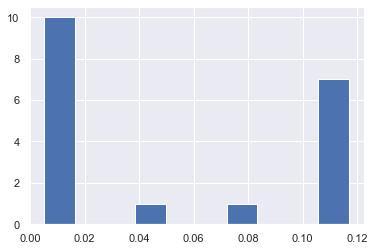

In [103]:
pd.Series(sel.estimator_.feature_importances_.ravel()).hist()


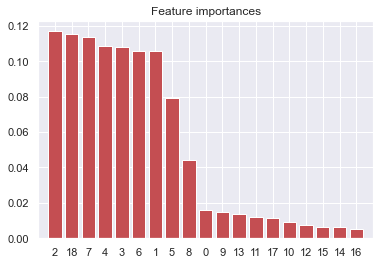

In [104]:
importances = sel.estimator_.feature_importances_
indices = np.argsort(importances)[::-1]
# X is the train data used to fit the model 
plt.figure()
plt.title("Feature importances")
plt.bar(range(x.shape[1]), importances[indices],
       color="r", align="center")
plt.xticks(range(x.shape[1]), indices)
plt.xlim([-1, x.shape[1]])
plt.show()

#### Hyperparameter Tuning


To tune hyperparameters manually one by one, first, we create a list of random forest classifiers with different values of each parameter, fit it, and save the model output to understand its impact better.

- Max_depth

In [105]:
tree_clf = [
    RandomForestClassifier(n_estimators=50, max_depth = 3, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, max_depth = 5, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, max_depth = 10, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, max_depth = 15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, max_depth = 20, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, max_depth = 40, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, max_depth = 100, random_state=42, class_weight='balanced')

   
]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)
row_index = 0

for alg in tree_clf:
        
    predicted = alg.fit(x_train, y_train).predict(x_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(x_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(x_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(roc_auc_score(y_test, alg.predict_proba(x_test)[:,1]),5)

    row_index+=1
    
clf_compare

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
0,0.59218,0.57197,0.21366,0.62451,0.65274
1,0.68942,0.64726,0.23591,0.53755,0.65683
2,0.91367,0.77507,0.26966,0.23715,0.63680
3,0.99143,0.83455,0.36066,0.04348,0.62469
4,0.99829,0.83992,0.50000,0.01186,0.62046
5,0.99922,0.83961,0.33333,0.00198,0.63208
6,0.99922,0.83961,0.33333,0.00198,0.63208


<Figure size 864x576 with 0 Axes>

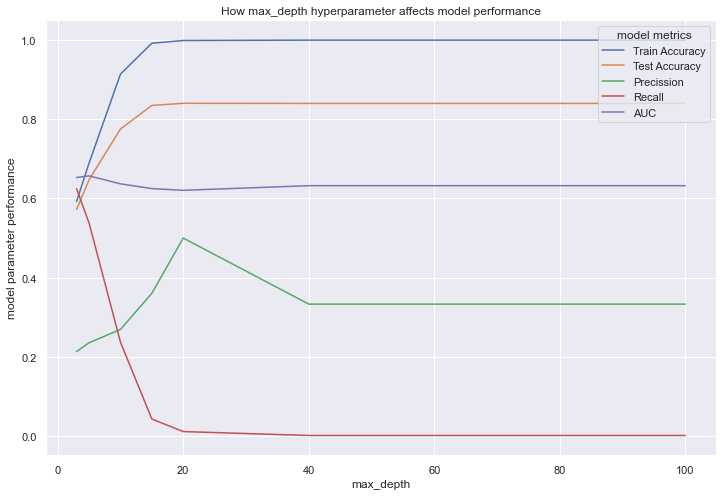

In [106]:
plt.figure(figsize = (12,8))
x_ = [3, 5, 10, 15, 20, 40,100]
# corresponding y axis values
y_ = clf_compare.values.tolist()
plt.figure(figsize = (12,8))
plt.plot(x_,y_)
plt.xlabel('max_depth')
plt.ylabel('model parameter performance')
plt.title('How max_depth hyperparameter affects model performance')
plt.legend(['Train Accuracy', 'Test Accuracy', 'Precission', 'Recall', 'AUC'],loc='upper right', title='model metrics')
plt.show()

With this set of hyperparameters, we observe that max_depth beyond "5" results in overfitting. And the most optimal value is in the range of "5", which produces the highest AUC value and does not overfit.

- Min_samples_split

In [107]:
tree_clf = [
    RandomForestClassifier(n_estimators=50, min_samples_split = 2, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_split = 10, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_split = 100, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_split = 1000, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_split = 10000, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_split = 25000, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_split = 50000, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_split = 75000, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_split = 100000, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_split = 150000, random_state=42, class_weight='balanced')
]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)
row_index = 0

for alg in tree_clf:
        
    predicted = alg.fit(x_train, y_train).predict(x_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(x_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(x_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(roc_auc_score(y_test, alg.predict_proba(x_test)[:,1]),5)

    row_index+=1
     
clf_compare

C:\Users\princ\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\princ\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\princ\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\princ\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\princ\anaconda3\lib\site-pa

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
0,0.99922,0.83961,0.33333,0.00198,0.63208
1,0.99423,0.83075,0.31646,0.04941,0.63568
2,0.78915,0.70073,0.25446,0.45059,0.65477
3,0.62599,0.60202,0.22674,0.61660,0.65429
4,0.83996,0.83992,0.00000,0.00000,0.50000
5,0.83996,0.83992,0.00000,0.00000,0.50000
6,0.83996,0.83992,0.00000,0.00000,0.50000
7,0.83996,0.83992,0.00000,0.00000,0.50000
8,0.83996,0.83992,0.00000,0.00000,0.50000
9,0.83996,0.83992,0.00000,0.00000,0.50000


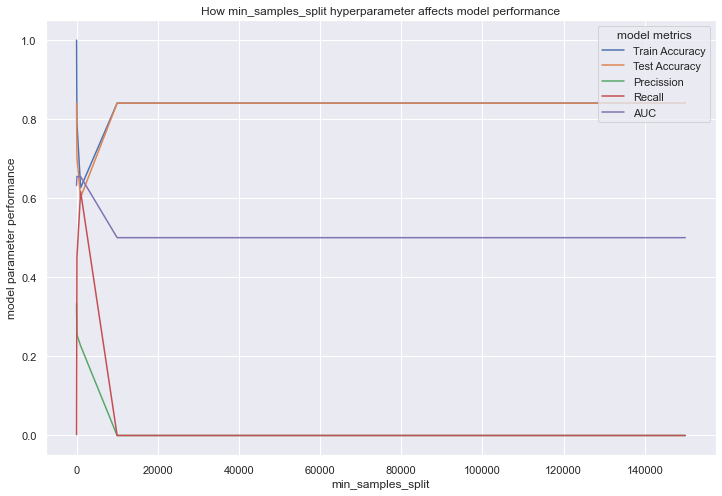

In [108]:
plt.figure(figsize = (12,8))
x = [2, 10, 100, 1000, 10000, 25000, 50000, 75000, 100000, 150000]
# corresponding y axis values
y = clf_compare.values.tolist()
plt.plot(x,y)
plt.xlabel('min_samples_split')
plt.ylabel('model parameter performance')
plt.title('How min_samples_split hyperparameter affects model performance')
plt.legend(['Train Accuracy', 'Test Accuracy', 'Precission', 'Recall', 'AUC'],loc='upper right', title='model metrics')
plt.show()

With this set of hyperparameters, we observe that min_samples_split below "1000" results in overfitting. And the most optimal value is in the range of "1000", which produces the highest AUC value and does not overfit. However, we can also see that numbers above "1000" do not significantly lose in AUC value and may help to produce trees with fewer splits which are easier to explain.

- Min_samples_leaf

In [109]:
tree_clf = [
    RandomForestClassifier(n_estimators=50, min_samples_leaf = 2, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_leaf = 10, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_leaf = 100, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_leaf = 1000, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_leaf = 10000, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_leaf = 25000, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_leaf = 50000, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_leaf = 75000, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_leaf = 100000, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_leaf = 150000, random_state=42, class_weight='balanced')
   
]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)
row_index = 0

for alg in tree_clf:
        
    predicted = alg.fit(x_train, y_train).predict(x_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(x_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(x_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(roc_auc_score(y_test, alg.predict_proba(x_test)[:,1]),5)

    row_index+=1
    
clf_compare

C:\Users\princ\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\princ\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\princ\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\princ\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\princ\anaconda3\lib\site-pa

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
0,0.99735,0.83898,0.45714,0.03162,0.62816
1,0.91289,0.76621,0.27977,0.29249,0.64671
2,0.66589,0.63461,0.23978,0.59091,0.65827
3,0.54449,0.53306,0.19763,0.62648,0.61685
4,0.83996,0.83992,0.00000,0.00000,0.50000
5,0.83996,0.83992,0.00000,0.00000,0.50000
6,0.83996,0.83992,0.00000,0.00000,0.50000
7,0.83996,0.83992,0.00000,0.00000,0.50000
8,0.83996,0.83992,0.00000,0.00000,0.50000
9,0.83996,0.83992,0.00000,0.00000,0.50000


<Figure size 864x576 with 0 Axes>

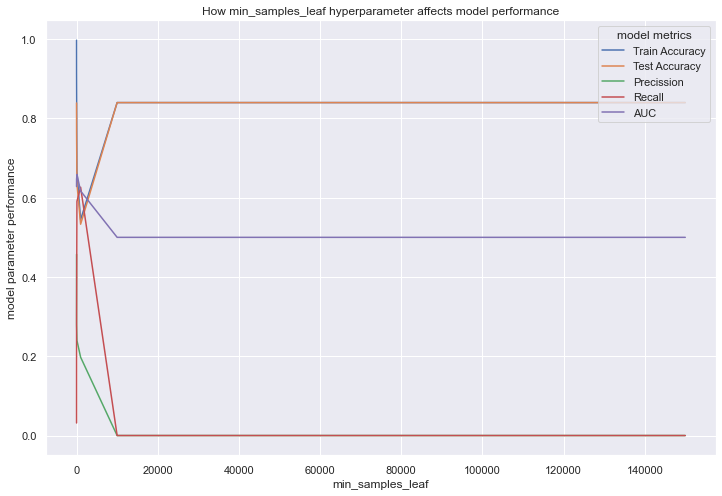

In [110]:
plt.figure(figsize = (12,8))
x = [2, 10, 100, 1000, 10000, 25000, 50000, 75000, 100000, 150000]
# corresponding y axis values
y = clf_compare.values.tolist()
plt.figure(figsize = (12,8))
plt.plot(x,y)
plt.xlabel('min_samples_leaf')
plt.ylabel('model parameter performance')
plt.title('How min_samples_leaf hyperparameter affects model performance')
plt.legend(['Train Accuracy', 'Test Accuracy', 'Precission', 'Recall', 'AUC'],loc='upper right', title='model metrics')
plt.show()

With this set of hyperparameters, we observe that min_samples_leaf below "100" results in overfitting. And the most optimal value is in the range of "100", which produces the highest AUC value and does not overfit.

- n_estimators

In [111]:
tree_clf = [
    RandomForestClassifier(n_estimators=2, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=5, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=10, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=50, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=100, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=500, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(n_estimators=1000, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced')
]    
    
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)
row_index = 0

for alg in tree_clf:
        
    predicted = alg.fit(x_train, y_train).predict(x_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(x_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(x_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(roc_auc_score(y_test, alg.predict_proba(x_test)[:,1]),5)

    row_index+=1
    
clf_compare

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
0,0.45660,0.46599,0.19058,0.71937,0.57532
1,0.49540,0.50332,0.19600,0.67787,0.59260
2,0.50927,0.50775,0.19688,0.67391,0.61303
3,0.54449,0.53306,0.19763,0.62648,0.61685
4,0.54761,0.53749,0.19823,0.62055,0.61718
5,0.53841,0.53021,0.19988,0.64427,0.61881
6,0.53639,0.52736,0.20024,0.65217,0.61899


<Figure size 864x576 with 0 Axes>

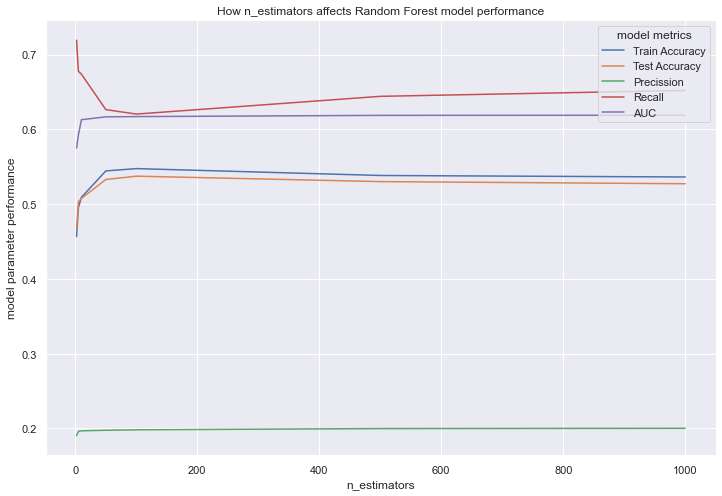

In [112]:
plt.figure(figsize = (12,8))
x = [2, 5, 10, 50, 100, 500, 1000]
# corresponding y axis values
y = clf_compare.values.tolist()
plt.figure(figsize = (12,8))
plt.plot(x,y)
plt.xlabel('n_estimators')
plt.ylabel('model parameter performance')
plt.title('How n_estimators affects Random Forest model performance')
plt.legend(['Train Accuracy', 'Test Accuracy', 'Precission', 'Recall', 'AUC'],loc='upper right', title='model metrics')
plt.show()

We see that n_estimators lower than 100 may yield a weaker model, and the ideal range is within "100". Increasing this parameter above this value may result in longer times to fit the model, but it will not lead to better results.

- max_features 

In [113]:
tree_clf = [
    RandomForestClassifier(max_features= 1, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(max_features= 2, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(max_features= 3, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(max_features= 4, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(max_features= 5, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(max_features= 6, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(max_features= 7, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(max_features= 8, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced')

    
]    
    
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)
row_index = 0

for alg in tree_clf:
        
    predicted = alg.fit(x_train, y_train).predict(x_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(x_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(x_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(roc_auc_score(y_test, alg.predict_proba(x_test)[:,1]),5)

    row_index+=1
    
clf_compare

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
0,0.55478,0.54255,0.19794,0.60870,0.61515
1,0.54901,0.53591,0.19569,0.61067,0.61628
2,0.54854,0.53780,0.19836,0.62055,0.61518
3,0.54761,0.53749,0.19823,0.62055,0.61718
4,0.54122,0.53148,0.19777,0.63043,0.61816
5,0.54418,0.53401,0.19838,0.62846,0.61843
6,0.54558,0.53907,0.20000,0.62648,0.61855
7,0.54231,0.53274,0.19713,0.62451,0.61925


<Figure size 864x576 with 0 Axes>

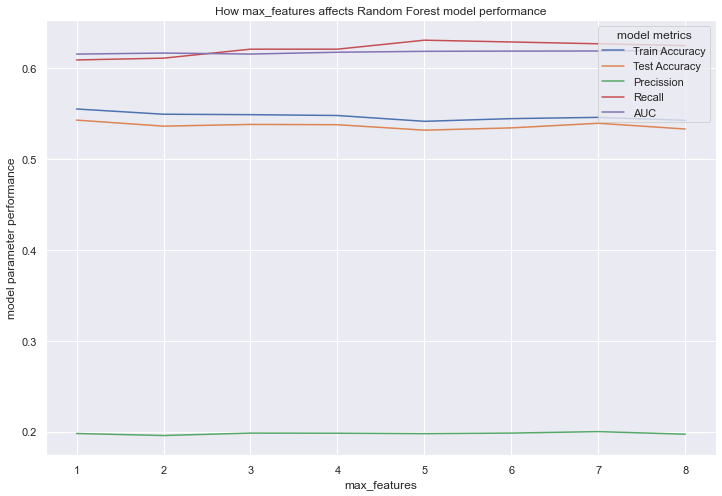

In [114]:
plt.figure(figsize = (12,8))
x = [1, 2, 3, 4, 5, 6, 7,8]
# corresponding y axis values
y = clf_compare.values.tolist()
plt.figure(figsize = (12,8))
plt.plot(x,y)
plt.xlabel('max_features')
plt.ylabel('model parameter performance')
plt.title('How max_features affects Random Forest model performance')
plt.legend(['Train Accuracy', 'Test Accuracy', 'Precission', 'Recall', 'AUC'],loc='upper right', title='model metrics')
plt.show()

We can learn that this specific hyperparameter does not impact the AUC value much in our dataset.

- Boot strap — max_samples

In [115]:
tree_clf = [
    RandomForestClassifier(max_samples=1, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(max_samples=1000, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(max_samples=2000, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(max_samples=3000, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(max_samples=4000, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(max_samples=5000, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced'),
    RandomForestClassifier(max_samples=6417, min_samples_split=1000, min_samples_leaf=1000, max_depth=15, random_state=42, class_weight='balanced')
]    
    
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)
row_index = 0

for alg in tree_clf:
        
    predicted = alg.fit(x_train, y_train).predict(x_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(x_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(x_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(roc_auc_score(y_test, alg.predict_proba(x_test)[:,1]),5)

    row_index+=1
    
clf_compare

C:\Users\princ\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\princ\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



,Train Accuracy,Test Accuracy,Precission,Recall,AUC
0,0.83996,0.83992,0.00000,0.00000,0.50000
1,0.83996,0.83992,0.00000,0.00000,0.50000
2,0.16004,0.16008,0.16008,1.00000,0.50000
3,0.55057,0.54255,0.19321,0.58498,0.59693
4,0.53561,0.52294,0.19264,0.62055,0.61265
5,0.54995,0.54065,0.19641,0.60474,0.61359
6,0.54761,0.53749,0.19823,0.62055,0.61718


<Figure size 864x576 with 0 Axes>

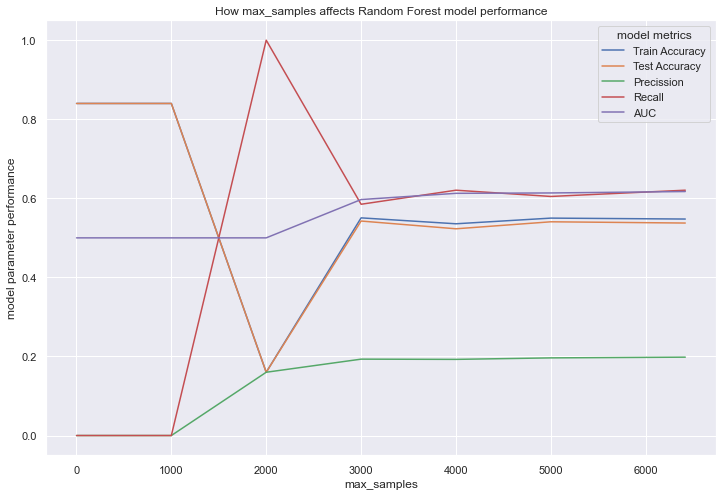

In [116]:
plt.figure(figsize = (12,8))
x = [1,1000,2000,3000,4000,5000,6417]
# corresponding y axis values
y = clf_compare.values.tolist()
plt.figure(figsize = (12,8))
plt.plot(x,y)
plt.xlabel('max_samples')
plt.ylabel('model parameter performance')
plt.title('How max_samples affects Random Forest model performance')
plt.legend(['Train Accuracy', 'Test Accuracy', 'Precission', 'Recall', 'AUC'],loc='upper right', title='model metrics')
plt.show()

Taking less than "5000" samples may result in a weaker model. However, any value above it does not significantly change model performance.

#### Random Search


In [117]:
clf1 = RandomForestClassifier(random_state=42, class_weight='balanced')
space = dict() 
space['max_depth'] = [3,5,10,15,20,40,100]
space['min_samples_split'] = [1000,10000,25000,50000]
space['min_samples_leaf'] = [1000,10000,25000,50000,75000]
space['max_features'] = [10,20,30]
space['max_samples'] = [1,1000,2000,3000,4000,5000,6417]
space['n_estimators'] = [2,5,10,15,50,100,500,1000]

In [118]:
# define search 
search = RandomizedSearchCV(clf1, space, n_iter=30, scoring='roc_auc', n_jobs=-1) 
# execute search 
tunned_tree = search.fit(x_train, y_train) 
#y_pred_tunned = clf1.predict(X_test)
# summarize result 
print("Parameters for RandomSearch", tunned_tree.best_params_)

NameError: name 'RandomizedSearchCV' is not defined

In [ ]:
clf = RandomForestClassifier(min_samples_split= 1000, min_samples_leaf=1000, n_estimators=1000,
                             max_depth=100, max_features = 10, max_samples = 4000, random_state=42, class_weight='balanced') 


clf.fit(x_train,y_train)

y_pred=clf.predict(x_test)

print('Accuracy of Random Forest classifier on train set: {:.2f}'.format(clf.score(x_train, y_train)))
print('Accuracy of Random Forest classifier on test set: {:.2f}'.format(clf.score(x_test, y_test)))
print('Recall of Random Forest classifier on test set: {:.2f}'.format(recall_score(y_test, y_pred)))
print('Precision of Random Forest classifier on test set: {:.2f}'.format(precision_score(y_test, y_pred)))
print('ROC/AUC of Random Forest classifier on test set: {:.2f}'.format(roc_auc_score(y_test, clf.predict_proba(x_test)[:,1]))) 

Let’s see confusion matrix for our tunned Random Forest model:



In [ ]:
clf_conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize = (12,8))
sns.set(font_scale=1.4)
ax = sns.heatmap(clf_conf_matrix, cmap='Blues',annot=True, fmt='d', square=True,xticklabels=['fully paid (0)', 'Not fully paid (1)'], yticklabels=['fully paid (0)', 'Not fully paid (1)'])
ax.set(xlabel='Predicted', ylabel='Actual')
ax.invert_yaxis()
ax.invert_xaxis()